In [22]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
from PIL import Image
from keras.utils.vis_utils import model_to_dot
from keras import Input
from keras.layers import Dense, Reshape, LeakyReLU, Conv2D, Conv2DTranspose, Flatten, Dropout
from keras.models import Model
from keras.optimizers import RMSprop
from tqdm import tqdm
from matplotlib import pyplot as plt


# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [23]:
os.system("ls /kaggle/input/utkface-new/")

UTKFace
crop_part1
utkface_aligned_cropped


0

In [24]:
PIC_DIR = "/kaggle/input/utkface-new/UTKFace/"
IMAGES_COUNT = 10000

ORIG_WIDTH = 178
ORIG_HEIGHT = 208
diff = (ORIG_HEIGHT - ORIG_WIDTH) // 2

WIDTH = 128
HEIGHT = 128

images = []
for pic_file in tqdm(os.listdir(PIC_DIR)[:IMAGES_COUNT]):
    pic = Image.open(PIC_DIR + pic_file).convert("RGB")
    pic = pic.resize((WIDTH, HEIGHT))
    images.append(np.array(pic) / 255)


100%|██████████| 10000/10000 [01:09<00:00, 144.91it/s]


In [46]:
from keras import Input
from keras.layers import Dense, Reshape, LeakyReLU, Conv2D, Conv2DTranspose, Flatten, Dropout
from keras.models import Model
from keras.optimizers import RMSprop
import tensorflow

In [47]:
LATENT_DIM = 32
CHANNELS = 3

def create_generator():
    gen_input = Input(shape=(LATENT_DIM, ))

    x = Dense(128 * 16 * 16)(gen_input)
    x = LeakyReLU()(x)
    x = Reshape((16, 16, 128))(x)

    x = Conv2D(256, 5, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2D(512, 5, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(512, 5, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(CHANNELS, 7, activation='tanh', padding='same')(x)

    generator = Model(gen_input, x)
    return generator

In [48]:
def create_discriminator():
    disc_input = Input(shape=(HEIGHT, WIDTH, CHANNELS))

    x = Conv2D(256, 3)(disc_input)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Flatten()(x)
    x = Dropout(0.4)(x)

    x = Dense(1, activation='sigmoid')(x)
    discriminator = Model(disc_input, x)

    optimizer = RMSprop(
        lr=.0001,
        clipvalue=1.0,
        decay=1e-8
    )

    discriminator.compile(
        optimizer=optimizer,
        loss='binary_crossentropy'
    )

    return discriminator

In [49]:
from IPython.display import Image
from keras.utils.vis_utils import model_to_dot

In [50]:
generator = create_generator()
generator.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 32)]              0         
                                                                 
 dense_4 (Dense)             (None, 32768)             1081344   
                                                                 
 leaky_re_lu_24 (LeakyReLU)  (None, 32768)             0         
                                                                 
 reshape_2 (Reshape)         (None, 16, 16, 128)       0         
                                                                 
 conv2d_18 (Conv2D)          (None, 16, 16, 256)       819456    
                                                                 
 leaky_re_lu_25 (LeakyReLU)  (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose_6 (Conv2DT  (None, 32, 32, 256)      1048

In [51]:
discriminator = create_discriminator()
discriminator.trainable = False
discriminator.summary()

Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_22 (Conv2D)          (None, 126, 126, 256)     7168      
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 126, 126, 256)     0         
                                                                 
 conv2d_23 (Conv2D)          (None, 62, 62, 256)       1048832   
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 62, 62, 256)       0         
                                                                 
 conv2d_24 (Conv2D)          (None, 30, 30, 256)       1048832   
                                                                 
 leaky_re_lu_33 (LeakyReLU)  (None, 30, 30, 256)       0   

In [52]:
gan_input = Input(shape=(LATENT_DIM, ))
gan_output = discriminator(generator(gan_input))
gan = Model(gan_input, gan_output)

In [53]:
optimizer = RMSprop(lr=.0001, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=optimizer, loss='binary_crossentropy')

In [54]:
gan.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_9 (InputLayer)        [(None, 32)]              0         
                                                                 
 model_6 (Functional)        (None, 128, 128, 3)       14953987  
                                                                 
 model_7 (Functional)        (None, 1)                 4211713   
                                                                 
Total params: 19,165,700
Trainable params: 14,953,987
Non-trainable params: 4,211,713
_________________________________________________________________


In [55]:
tensorflow.keras.utils.disable_interactive_logging()

  5%|▍         | 49/1000 [01:39<31:00,  1.96s/it]

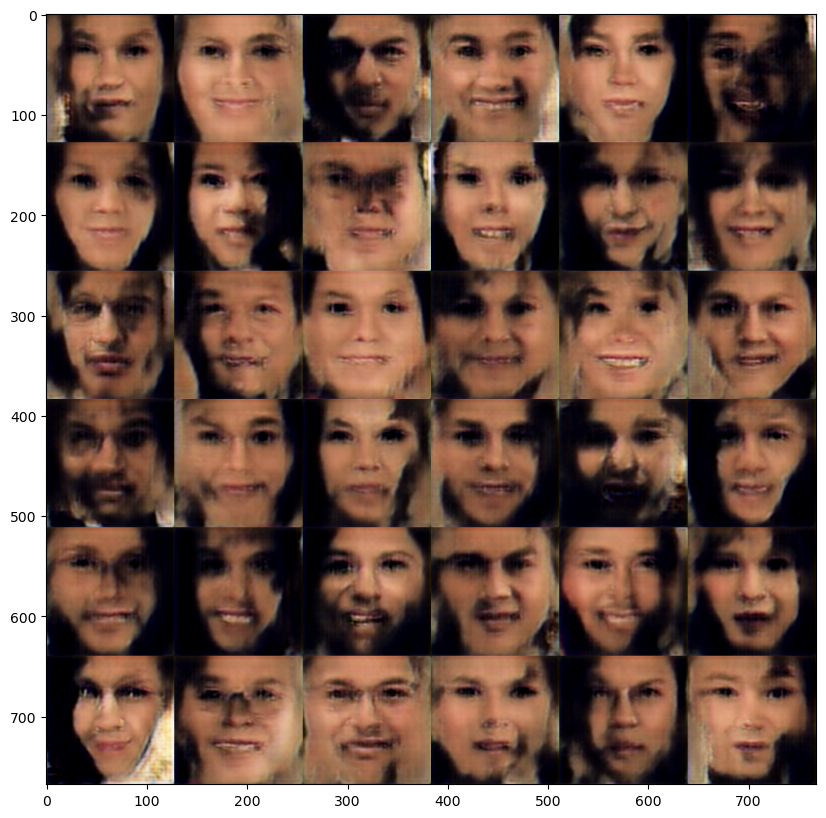

 10%|▉         | 99/1000 [03:25<30:34,  2.04s/it]

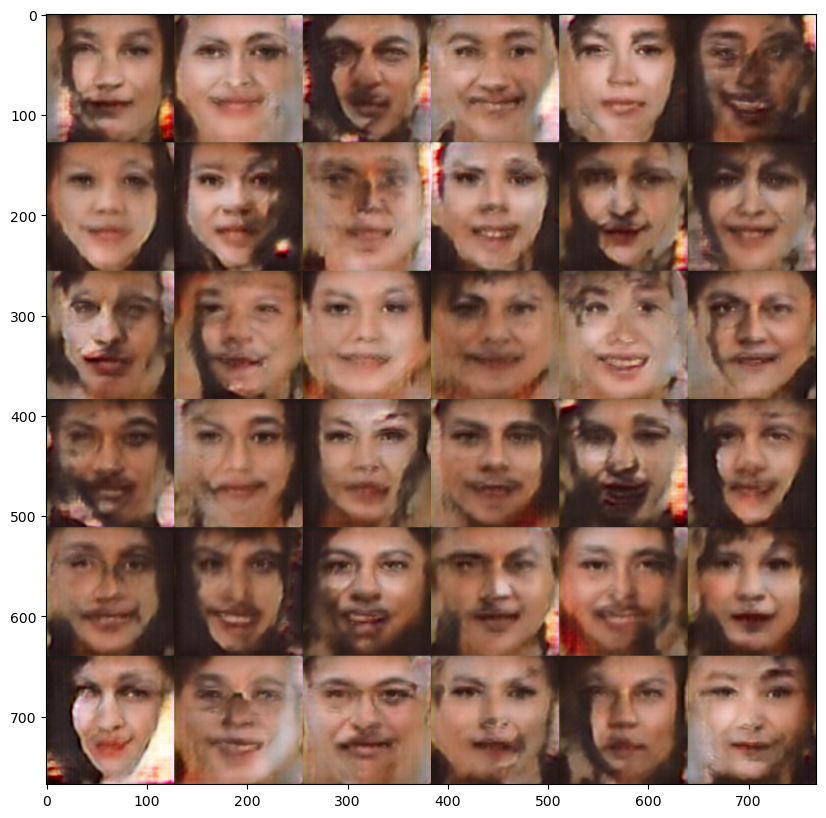

 15%|█▍        | 149/1000 [05:11<29:30,  2.08s/it]

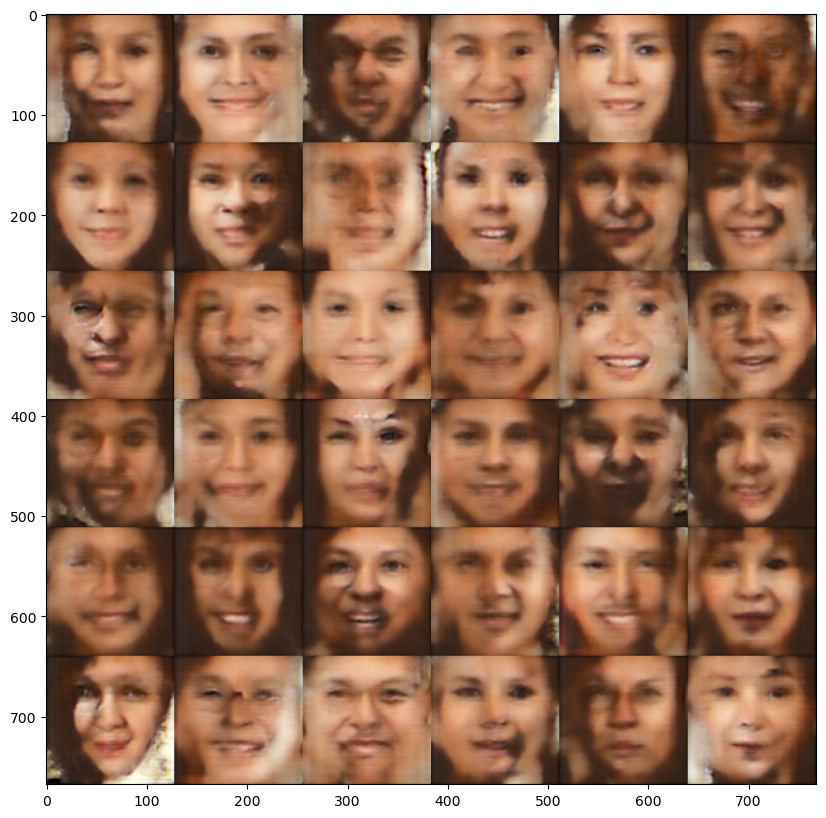

 20%|█▉        | 199/1000 [06:56<26:06,  1.96s/it]

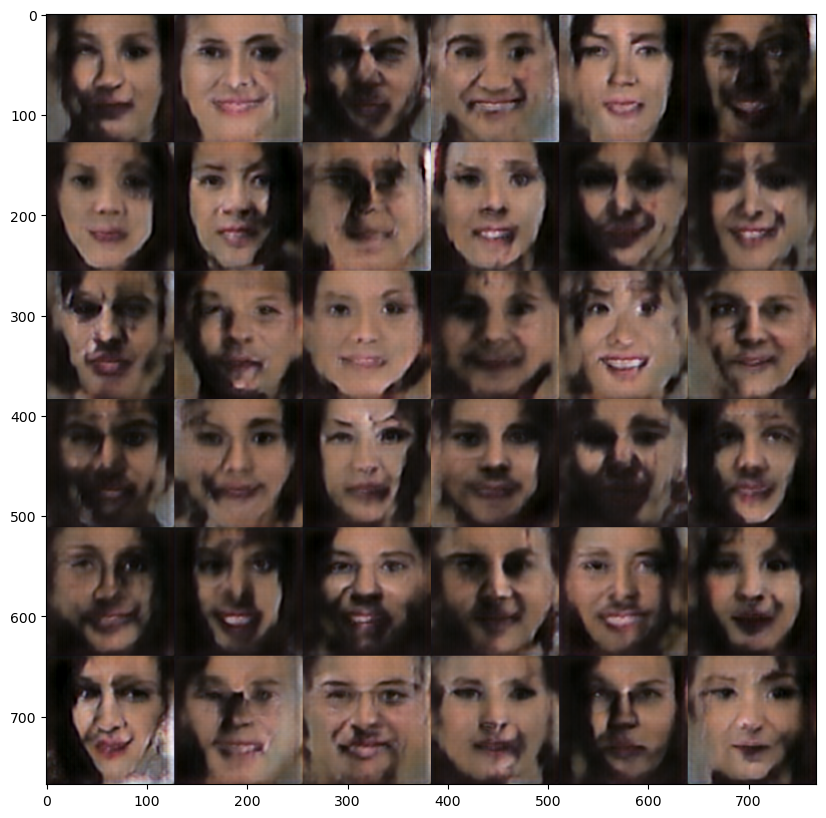

 25%|██▍       | 249/1000 [08:42<24:42,  1.97s/it]

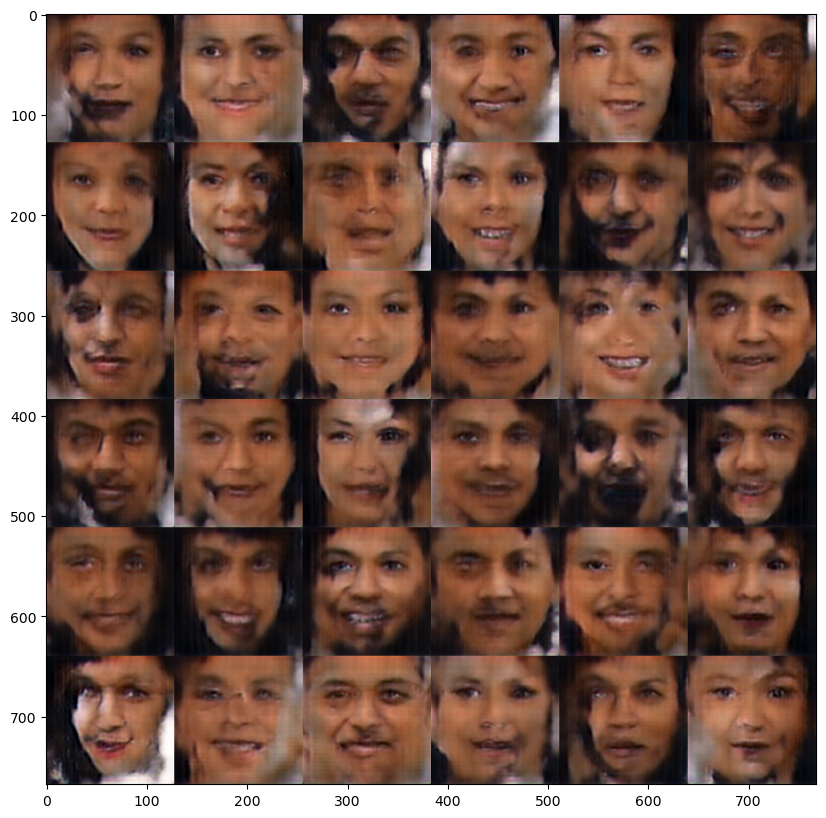

 30%|██▉       | 299/1000 [10:27<23:09,  1.98s/it]

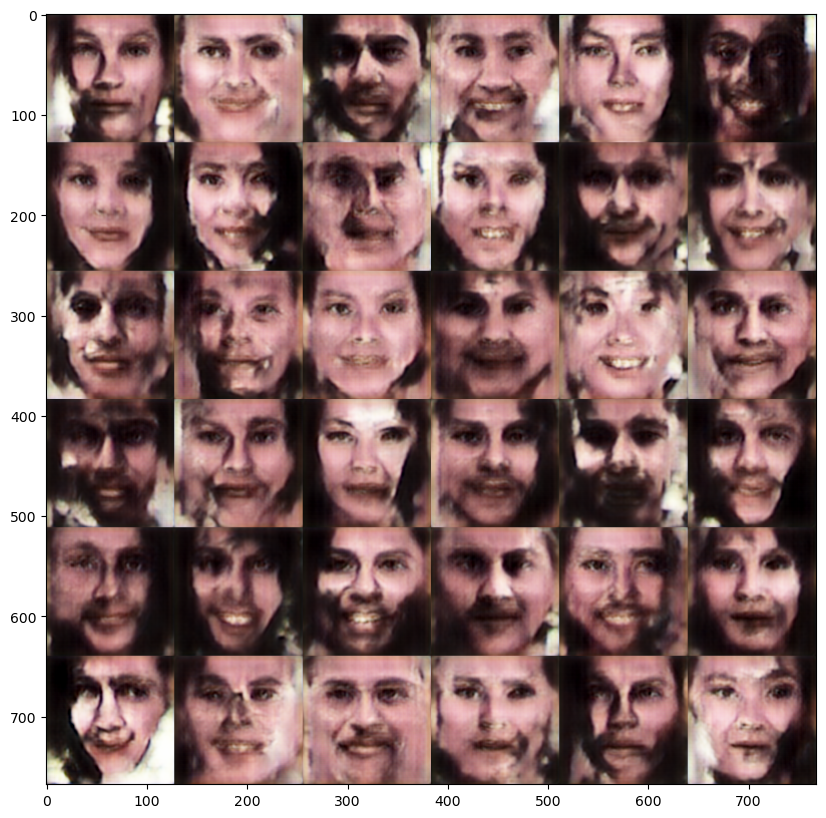

 35%|███▍      | 349/1000 [12:11<21:14,  1.96s/it]

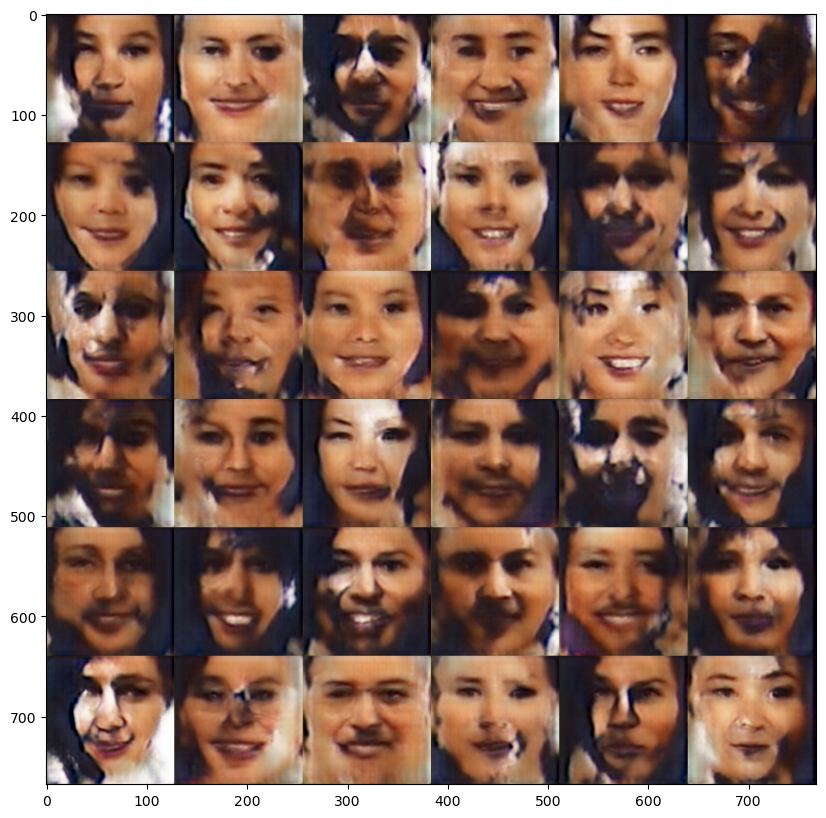

 40%|███▉      | 399/1000 [13:56<19:49,  1.98s/it]

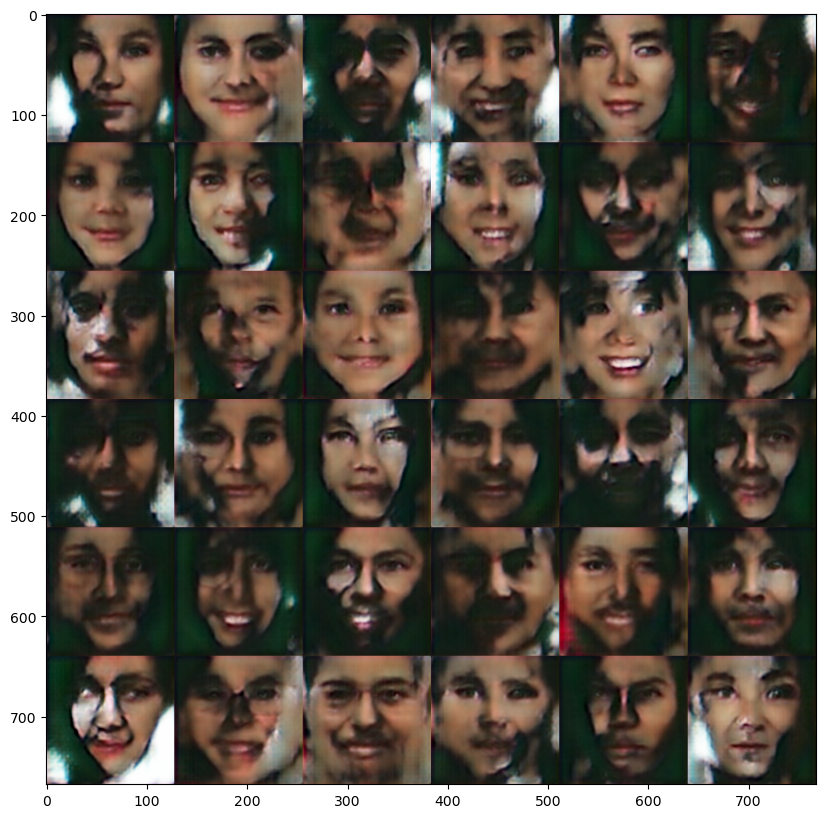

 45%|████▍     | 449/1000 [15:41<18:25,  2.01s/it]

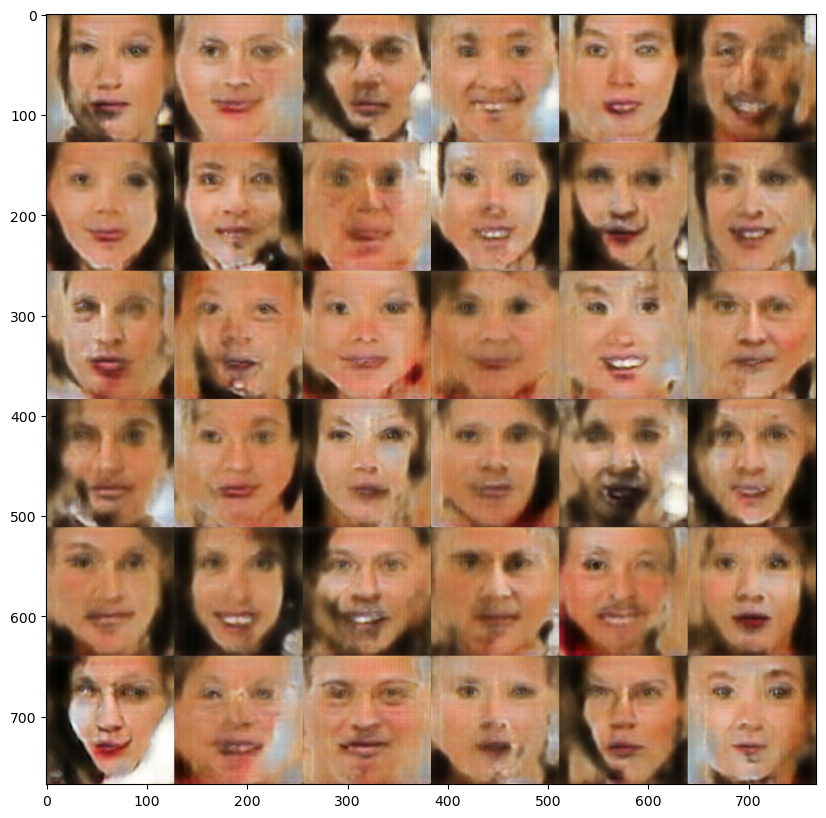

 50%|████▉     | 499/1000 [17:27<16:28,  1.97s/it]

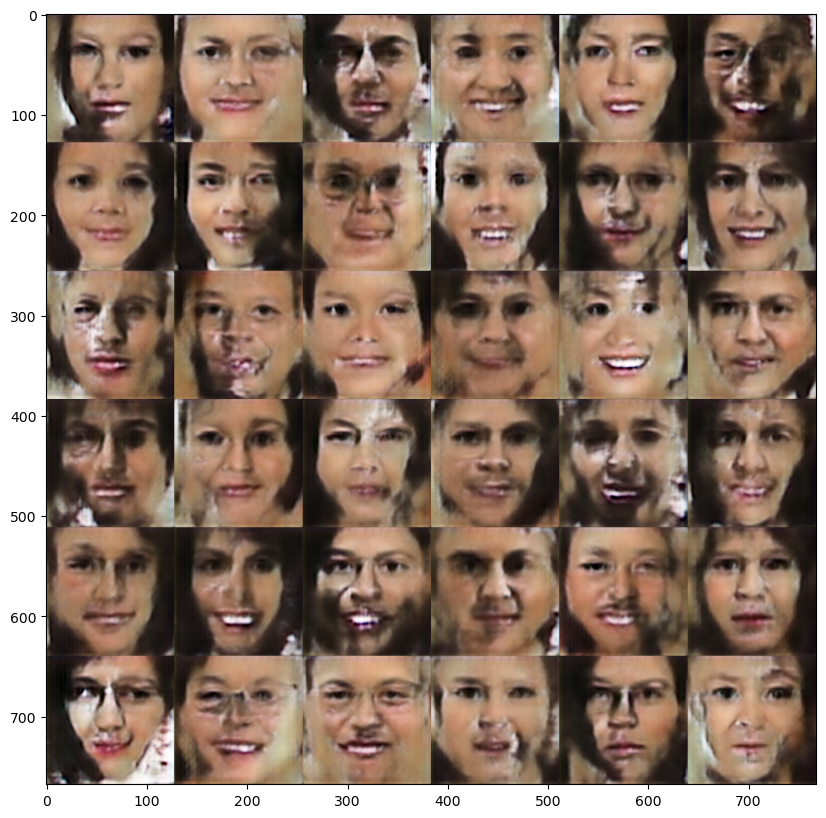

 55%|█████▍    | 549/1000 [19:13<15:31,  2.07s/it]

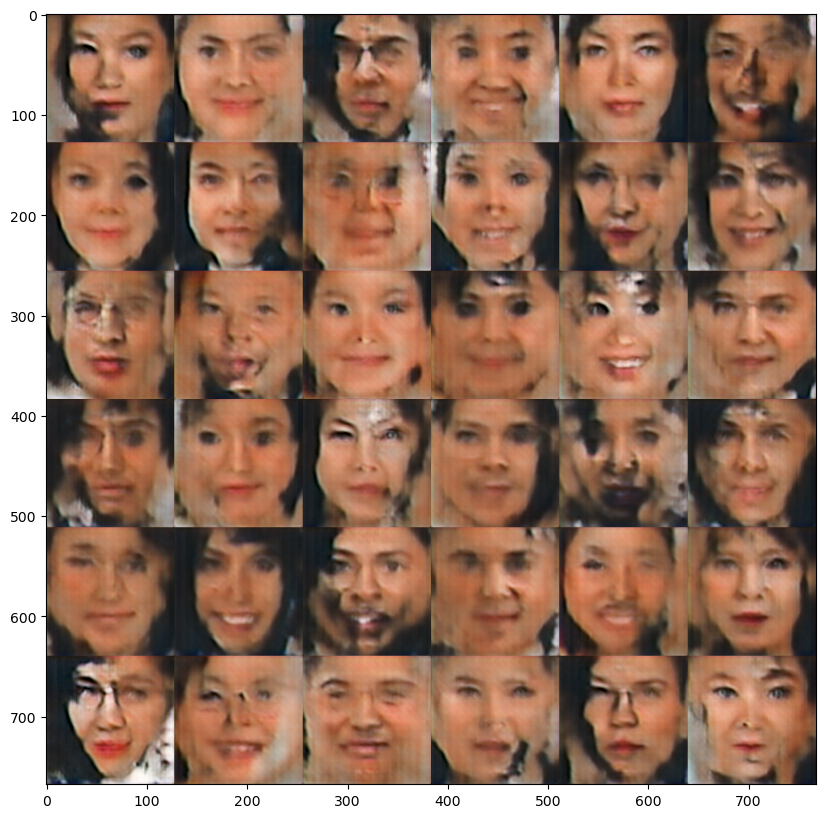

 60%|█████▉    | 599/1000 [20:58<13:10,  1.97s/it]

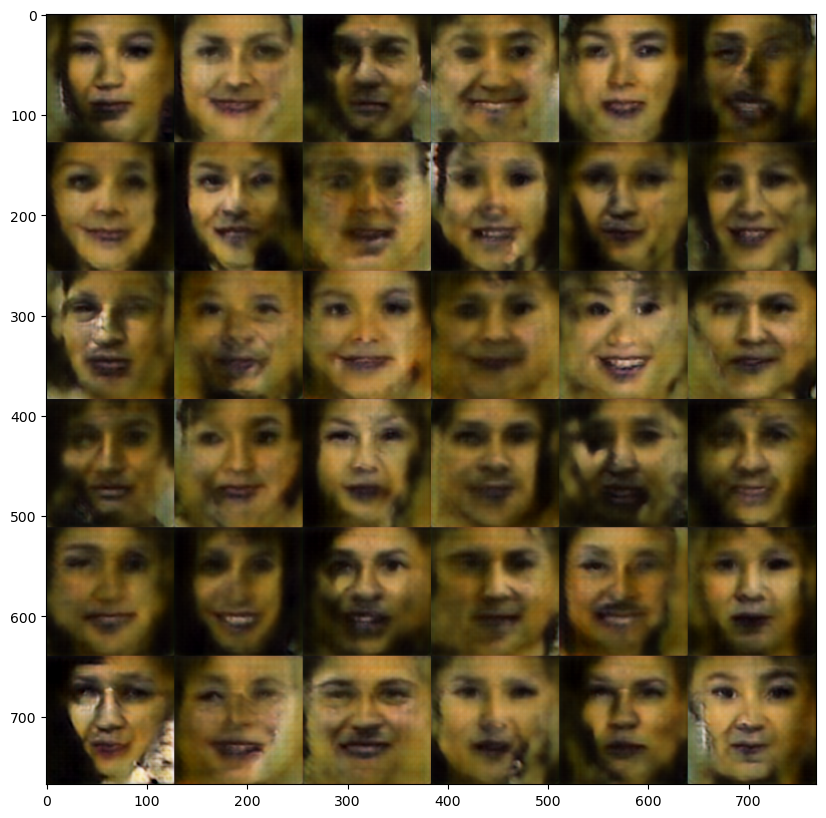

 62%|██████▎   | 625/1000 [21:56<13:09,  2.11s/it]


ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 4 dimension(s) and the array at index 1 has 1 dimension(s)

In [62]:
import time
iters = 1000
batch_size = 16

RES_DIR = 'res2'
FILE_PATH = '%s/generated_%d.png'
if not os.path.isdir(RES_DIR):
    os.mkdir(RES_DIR)

CONTROL_SIZE_SQRT = 6
control_vectors = np.random.normal(size=(CONTROL_SIZE_SQRT**2, LATENT_DIM)) / 2

start = 0
d_losses = []
a_losses = []
images_saved = 0
for step in tqdm(range(iters)):
    start_time = time.time()
    latent_vectors = np.random.normal(size=(batch_size, LATENT_DIM))
    generated = generator.predict(latent_vectors)

    real = images[start:start + batch_size]
    combined_images = np.concatenate([generated, real])

    labels = np.concatenate([np.ones((batch_size, 1)), np.zeros((batch_size, 1))])
    labels += .05 * np.random.random(labels.shape)

    d_loss = discriminator.train_on_batch(combined_images, labels)
    d_losses.append(d_loss)

    latent_vectors = np.random.normal(size=(batch_size, LATENT_DIM))
    misleading_targets = np.zeros((batch_size, 1))

    a_loss = gan.train_on_batch(latent_vectors, misleading_targets)
    a_losses.append(a_loss)

    start += batch_size

    if step % 50 == 49:
        gan.save_weights('gan.h5')

        #print('%d/%d: d_loss: %.4f,  a_loss: %.4f.  (%.1f sec)' )
        control_image = np.zeros((WIDTH * CONTROL_SIZE_SQRT, HEIGHT * CONTROL_SIZE_SQRT, CHANNELS))

        for i, latent_vector in enumerate(control_vectors):
            generated = generator.predict(np.array([latent_vector]))
            generated = generated.reshape(HEIGHT, WIDTH, CHANNELS)
            control_image[
                (i // CONTROL_SIZE_SQRT) * HEIGHT : ((i // CONTROL_SIZE_SQRT) + 1) * HEIGHT,
                (i % CONTROL_SIZE_SQRT) * WIDTH : ((i % CONTROL_SIZE_SQRT) + 1) * WIDTH,
                :
            ] = generated

        plt.figure(figsize=(10, 10))
        plt.imshow(control_image)
        plt.show()


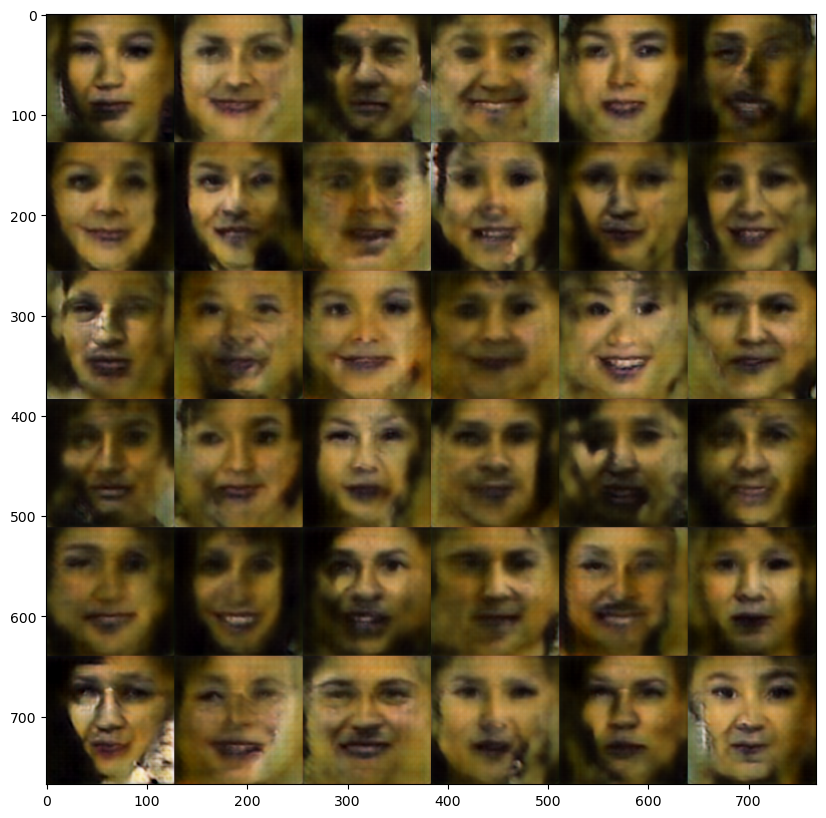

In [63]:
plt.figure(figsize=(10, 10))
plt.imshow(control_image)
plt.show()